In [36]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from models import GeomagneticField
from models import Orbit
from models import Spacecraft
from models import AttitudeControlSystem
from scipy.spatial.transform import Rotation 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d

In [46]:
geomagnetic_field = GeomagneticField(2020)
orbit = Orbit(altitude=2000*10**3, alpha=82*np.pi/180, beta=0, gamma=np.pi, geomagnetic_field=geomagnetic_field)

I = np.identity(3)

a = 20*10**(-2)
b = 10*10**(-2)
c = 10*10**(-2)
mu = 2.6 

I[0][0] = (a**2 + b**2)*mu/12
I[1][1] = (a**2 + c**2)*mu/12
I[2][2] = (a**2 + b**2)*mu/12

acs = AttitudeControlSystem()
acs.add_hysteresis_rod(coercivity=5, remanence=1.55, saturation_field=2.1, volume=7.85*10**(-6), direction=np.array([0,0,1]))
acs.add_hysteresis_rod(coercivity=5, remanence=1.55, saturation_field=2.1, volume=7.85*10**(-6), direction=np.array([0,1,0]))
acs.add_hysteresis_rod(coercivity=5, remanence=1.55, saturation_field=2.1, volume=7.85*10**(-6), direction=np.array([1,0,0]))

acs.add_permanent_magnet(remanence=1.35, volume=5*10**(-6), direction=np.array([-1,0,0]))

cubesat = Spacecraft(I, 0.01,acs)

time_step = 0.01
total_time = int(2*np.pi/orbit.velocity)
computation_steps = int(np.ceil(total_time/time_step))

velocity = np.zeros((computation_steps,3))
rotation_angle = np.zeros(computation_steps)
time = np.zeros(computation_steps)

torque = np.zeros((computation_steps,3))
attitude = np.zeros((computation_steps,4))
magnetic_field = np.zeros((computation_steps,3))
magnetic_induction = np.zeros((computation_steps,3))
magnetic_field_projection = np.zeros((computation_steps,3))
magnetic_field_derivative = np.zeros((computation_steps,3))
angle = np.zeros(computation_steps)

probe = np.zeros((computation_steps,3))

velocity[0] = cubesat.velocity
rotation_angle[0] = np.linalg.norm(velocity[0]*time_step/2)

r = Rotation.from_quat(cubesat.attitude)

cubesat.attitude_control_system.hysteresis_rods[0].direction =  r.apply(cubesat.attitude_control_system.hysteresis_rods[0].initial_direction)
cubesat.attitude_control_system.hysteresis_rods[1].direction =  r.apply(cubesat.attitude_control_system.hysteresis_rods[1].initial_direction)
cubesat.attitude_control_system.hysteresis_rods[2].direction =  r.apply(cubesat.attitude_control_system.hysteresis_rods[2].initial_direction)

cubesat.attitude_control_system.hysteresis_rods[0].set_initial_condition(orbit.magnetic_field)
cubesat.attitude_control_system.hysteresis_rods[1].set_initial_condition(orbit.magnetic_field)
cubesat.attitude_control_system.hysteresis_rods[2].set_initial_condition(orbit.magnetic_field)

for i in range(0,computation_steps):
    magnetic_field[i] = orbit.magnetic_field
    magnetic_field_derivative[i] = orbit.magnetic_field_derivative
    angle[i] = orbit.orbital_angular_position
        
    torque[i] = cubesat.attitude_control_system.torque
    velocity[i] = cubesat.velocity
    rotation_angle[i] = np.linalg.norm(velocity[i]*time_step/2)
    attitude[i] = cubesat.attitude

    cubesat.propagate_state(time_step,magnetic_field[i],magnetic_field_derivative[i])
    orbit.propagate_orbit(time_step) 
    
    magnetic_induction[i][0] = np.dot(cubesat.attitude_control_system.hysteresis_rods[0].B,cubesat.attitude_control_system.hysteresis_rods[0].direction)
    magnetic_induction[i][1] = np.dot(cubesat.attitude_control_system.hysteresis_rods[1].B,cubesat.attitude_control_system.hysteresis_rods[1].direction)
    magnetic_induction[i][2] = np.dot(cubesat.attitude_control_system.hysteresis_rods[2].B,cubesat.attitude_control_system.hysteresis_rods[2].direction)

    magnetic_field_projection[i][0] = np.dot(magnetic_field[i],cubesat.attitude_control_system.hysteresis_rods[0].direction)
    magnetic_field_projection[i][1] = np.dot(magnetic_field[i],cubesat.attitude_control_system.hysteresis_rods[1].direction)
    magnetic_field_projection[i][2] = np.dot(magnetic_field[i],cubesat.attitude_control_system.hysteresis_rods[2].direction)

    probe[i][0] = cubesat.attitude_control_system.hysteresis_rods[0].state
    probe[i][1] = cubesat.attitude_control_system.hysteresis_rods[1].state
    probe[i][2] = cubesat.attitude_control_system.hysteresis_rods[2].state


    time[i] = i*time_step
    #if i == 1 or i %10 == 0:
        #cubesat.plot_cube()

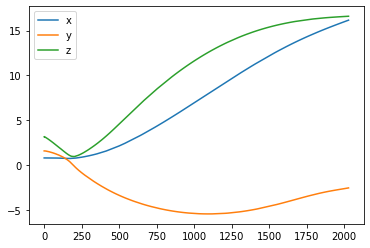

In [47]:
plt.plot(time,velocity)
plt.legend(['x', 'y', 'z'])
plt.show()

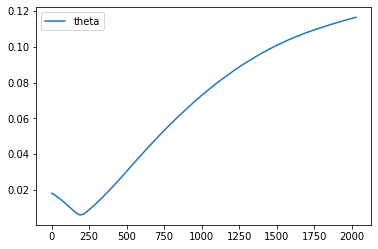

In [48]:
plt.plot(time,rotation_angle)
plt.legend(['theta'])
plt.show()

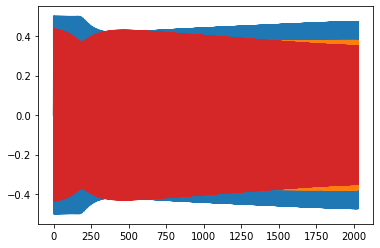

In [49]:
plt.plot(time,attitude)
plt.show()

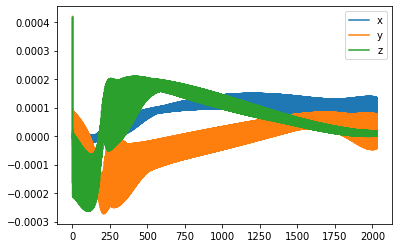

In [50]:
plt.plot(time,torque)
plt.legend(['theta'])
plt.legend(['x', 'y', 'z'])
plt.show()

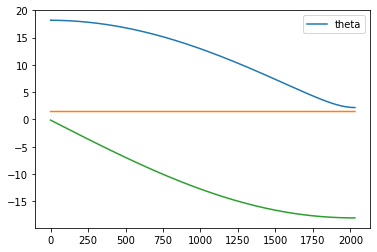

In [51]:
plt.plot(time[:i],magnetic_field[:i])
plt.legend(['theta'])
plt.show()

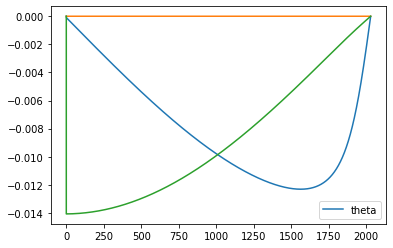

In [52]:
plt.plot(time[:i],magnetic_field_derivative[:i])
plt.legend(['theta'])
plt.show()

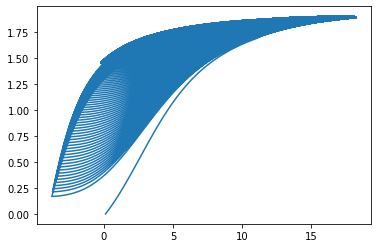

In [53]:
plt.plot(magnetic_field_projection.T[0][:i],magnetic_induction.T[0][:i])

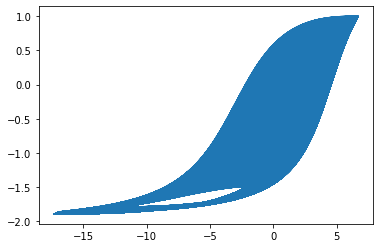

In [54]:
plt.plot(magnetic_field_projection.T[1][:i],magnetic_induction.T[1][:i])

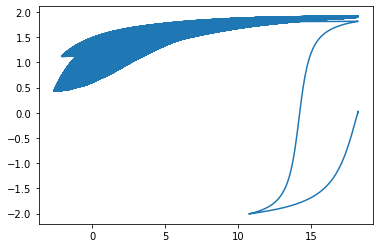

In [55]:
plt.plot(magnetic_field_projection.T[2][:i],magnetic_induction.T[2][:i])